In [4]:
!pip install diffusers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 11.6 MB/s eta 0:00:00


In [5]:
import torch
from diffusers import StableDiffusionPipeline, DPMSolverMultistepScheduler

model_id = "stabilityai/stable-diffusion-2-1"

pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to("cuda")

prompt = "a photo of an astronaut riding a horse on mars"
image = pipe(prompt).images[0]

image.save("astronaut_rides_horse1.png")

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/345 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/939 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

In [6]:
image = pipe(prompt).images[0]

image.save("astronaut_rides_horse1.png")

  0%|          | 0/50 [00:00<?, ?it/s]

In [9]:
generator = torch.Generator("cuda").manual_seed(1337)

image = pipe(prompt, generator=generator).images[0]

image.save("astronaut_rides_horse2.png")

  0%|          | 0/50 [00:00<?, ?it/s]

In [10]:
# didn't set seed again

image = pipe (prompt, generator=generator, num_inference_steps=15).images[0]

image.save("astronaut_rides_horse3.png")

  0%|          | 0/15 [00:00<?, ?it/s]

In [12]:
generator = torch.Generator("cuda").manual_seed(1337)

image = pipe(prompt, generator=generator, num_inference_steps=15).images[0]

image.save("astronaut_rides_horse4.png")

  0%|          | 0/15 [00:00<?, ?it/s]

In [13]:
generator = torch.Generator("cuda").manual_seed(1337)

image = pipe(prompt, generator=generator, num_inference_steps=50, guidance_scale=15).images[0]

image.save("astronaut_rides_horse5.png")

  0%|          | 0/50 [00:00<?, ?it/s]

In [14]:
generator = torch.Generator("cuda").manual_seed(1337)

image = pipe(prompt, generator=generator, num_inference_steps=50, guidance_scale=1).images[0]

image.save("astronaut_rides_horse6.png")

  0%|          | 0/50 [00:00<?, ?it/s]

In [15]:
from PIL import Image

def image_grid(imgs, rows, cols):
  assert len(imgs) == rows * cols

  w, h = imgs[0].size
  grid = Image.new('RGB', size=(cols*w, rows*h))
  grid_w, grid_h = grid.size

  for i, img in enumerate(imgs):
    grid.paste(img, box=(i%cols*w, i//cols*h))
  return grid

In [17]:
num_images=6
prompt = ["a photo of an astronaut riding a horse on mars"] * 6
images = pipe(prompt).images

grid = image_grid(images, 3, 2)

  0%|          | 0/50 [00:00<?, ?it/s]

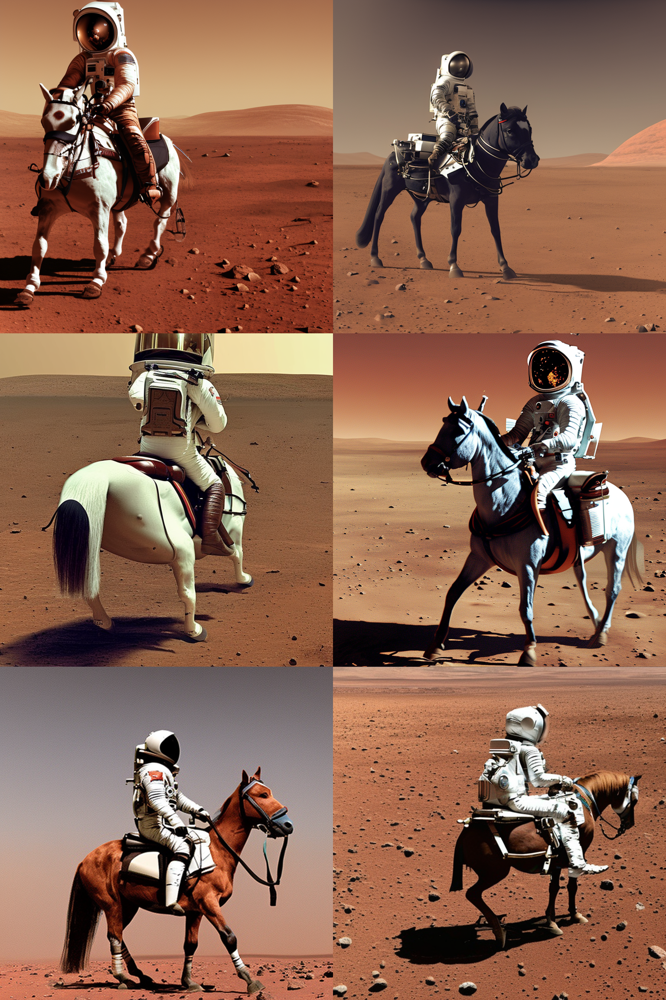

In [18]:
grid

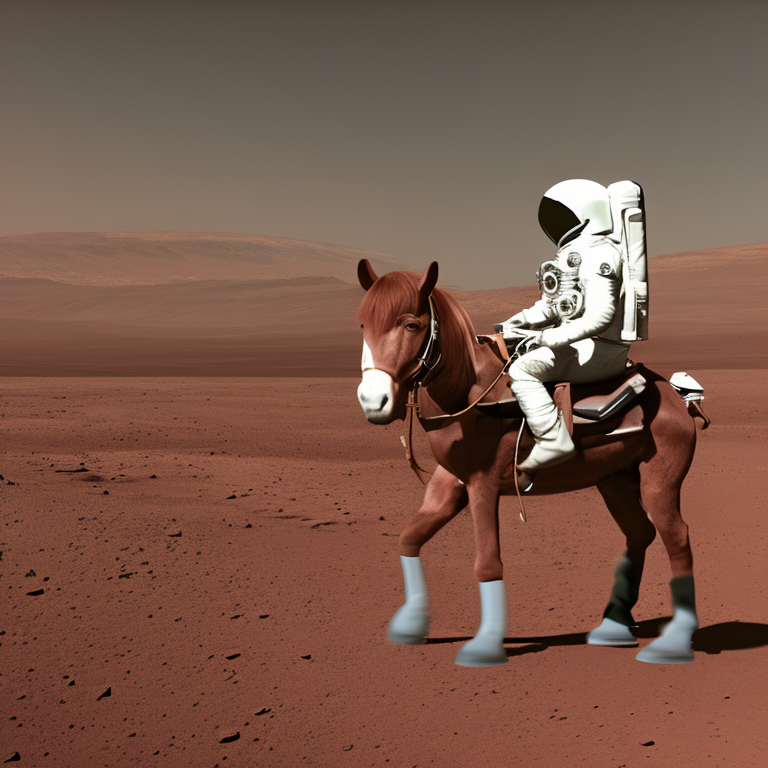

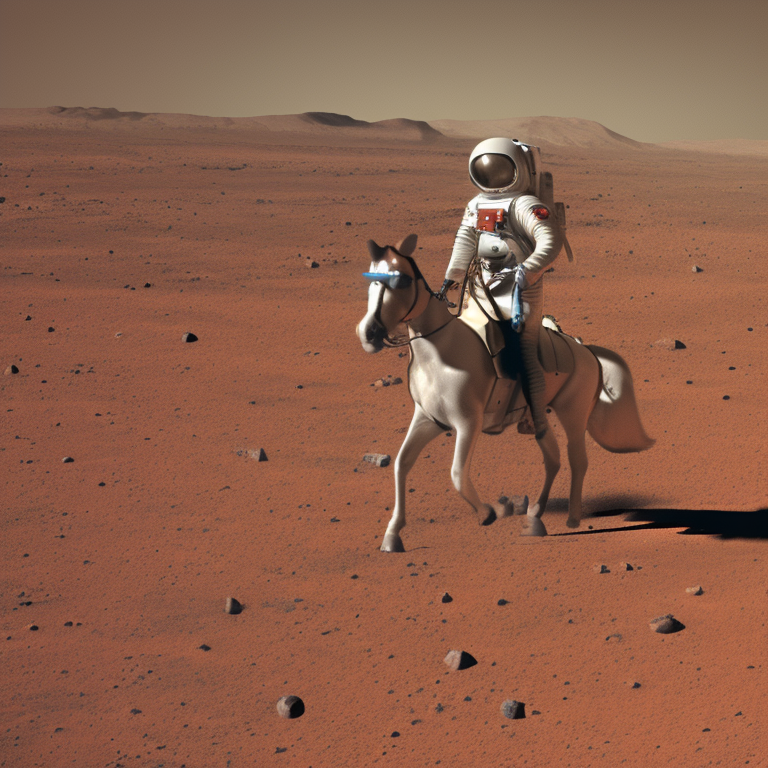

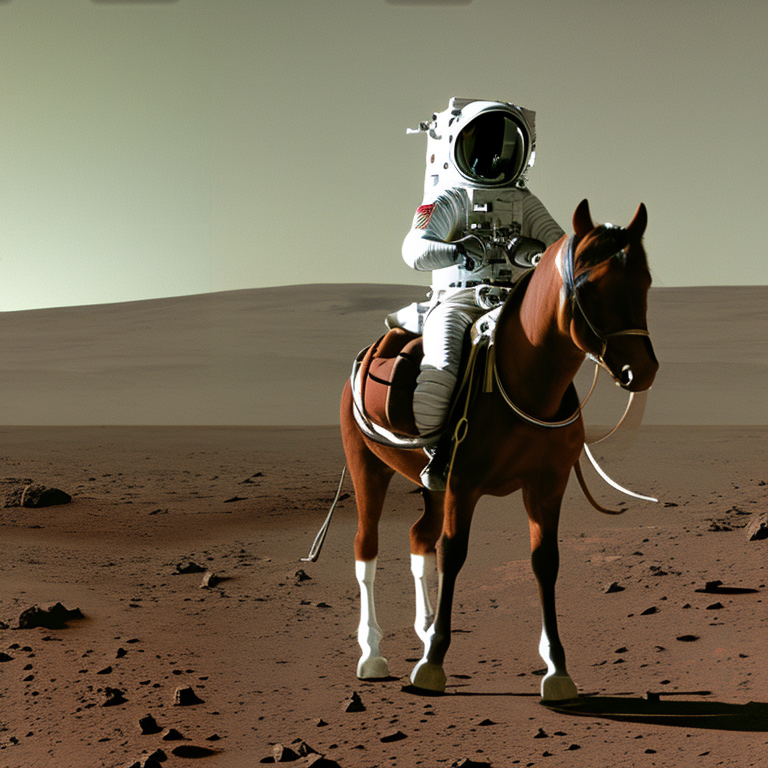

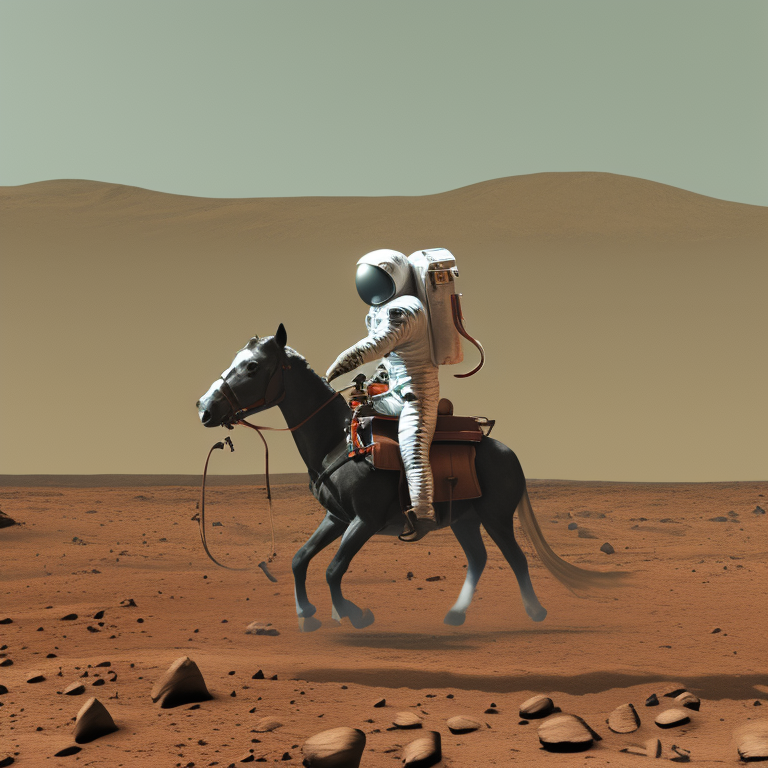

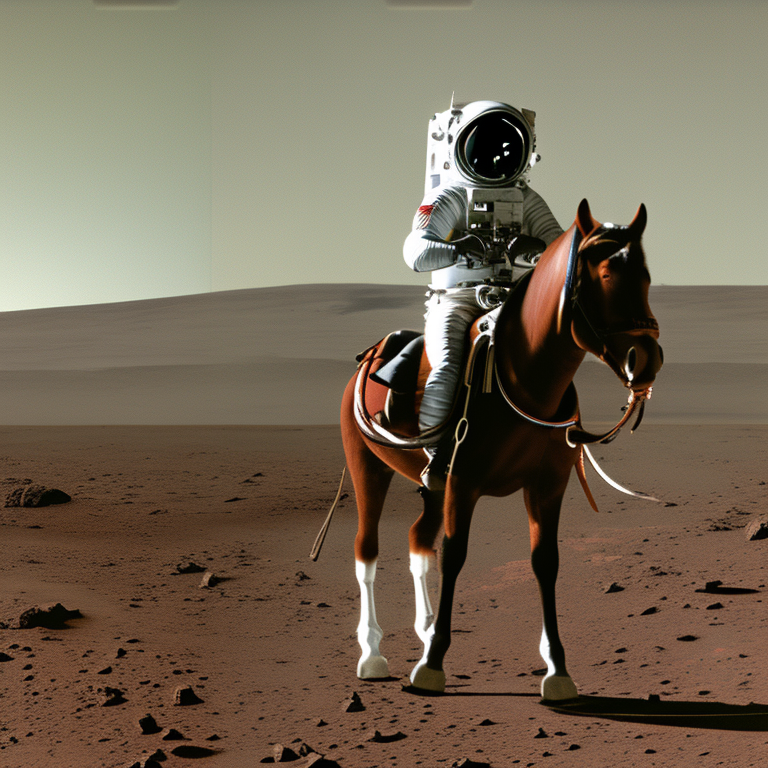

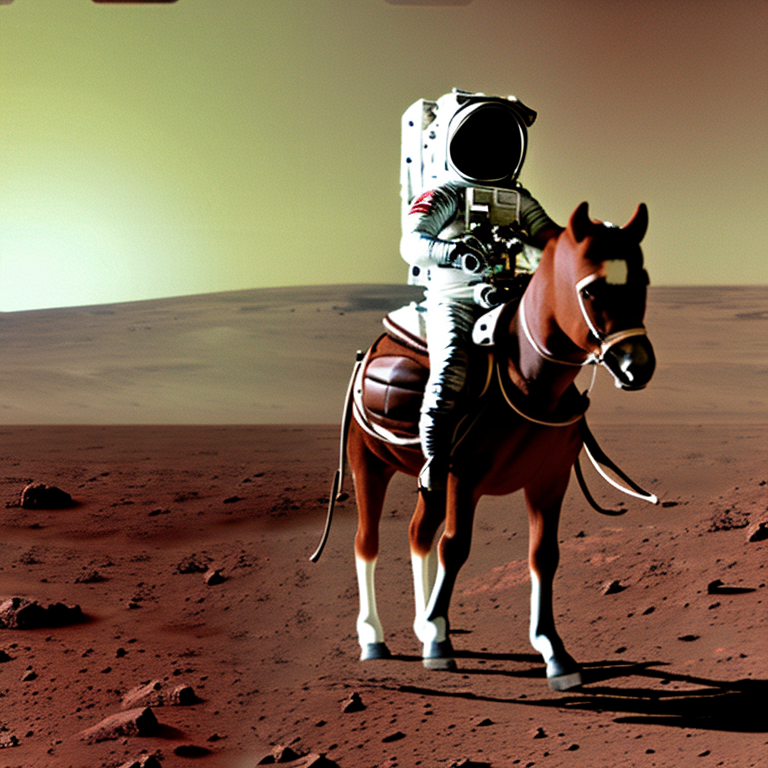

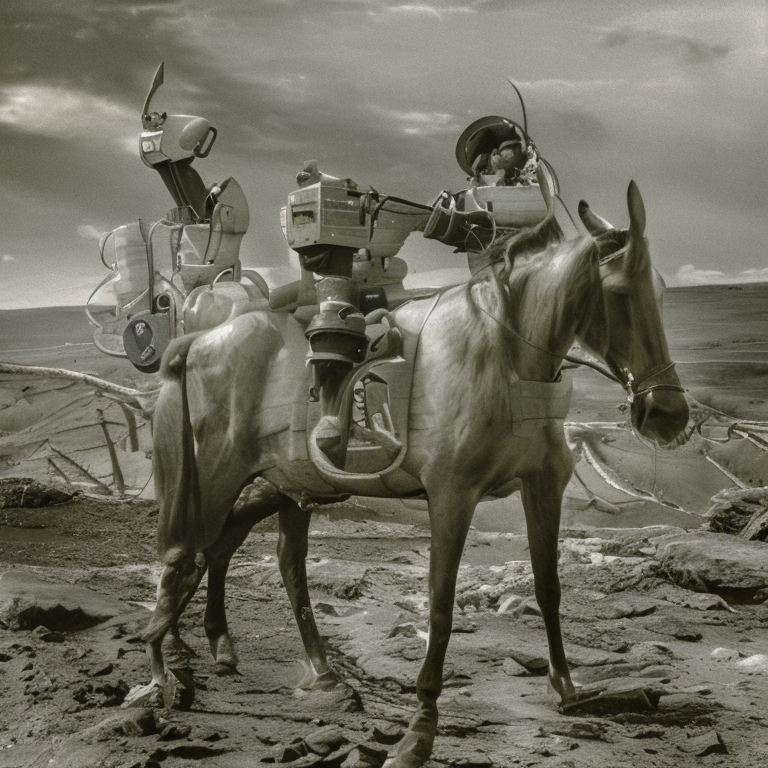

In [20]:
import cv2

from google.colab.patches import cv2_imshow

for count in range(7):
  img = cv2.imread(f'/content/astronaut_rides_horse{count}.png')
  cv2_imshow(img)